
# Application of a model trained by multi-task learning

it is a binary segmentation problem

the synthetic 3D seismic and corresponding fault images are in the folder ./data/train/ 

In [1]:
# Some common parameters used by all images.





## Train with data generator

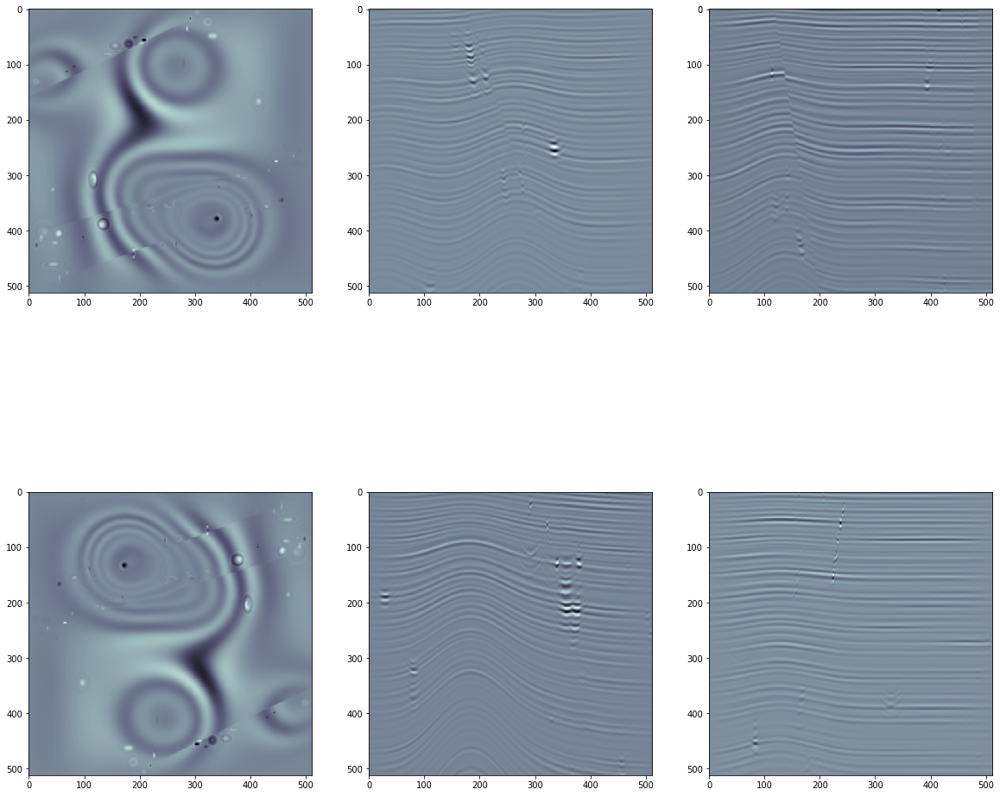

In [6]:
import numpy as np
import os
import matplotlib.pyplot as plt
#%matplotlib inline
c
u1Path = '../../efault/data/lspTrain/u1/'
u2Path = '../../efault/data/lspTrain/u2/'
u3Path = '../../efault/data/lspTrain/u3/'
fxPath = '../../efault/data/lspTrain/fault/'

fn = str(86)+'.dat'
sx = np.fromfile(sxPath+fn,dtype=np.single)
kx = np.fromfile(kxPath+fn,dtype=np.single)

xs = np.std(sx)
xm = np.mean(sx)
sx = sx-xm
sx = sx/xs
x = np.reshape(sx,(512,512,512))
#x = x[0:128,0:120,0:110]
x = np.transpose(x)
y = np.rot90(x,2,(2,1))

k1,k2,k3=64,64,64
fig = plt.figure(figsize=(20,60))
plt.subplot(6, 3, 1)
plt.imshow((x[k1,:,:]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)
plt.subplot(6, 3, 2)
plt.imshow((x[:,k2,:]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)
plt.subplot(6, 3, 3)
plt.imshow((x[:,:,k3]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)

plt.subplot(6, 3, 4)
plt.imshow((y[k1,:,:]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)
plt.subplot(6, 3, 5)
plt.imshow((y[:,k2,:]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)
plt.subplot(6, 3, 6)
plt.imshow((y[:,:,k3]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)



In [1]:
import math
import skimage
import numpy as np
import tensorflow as tf
from keras.layers import *
from keras.models import load_model
from skimage.measure import compare_psnr
from unet3 import cross_entropy_balanced
from unet3 import cosine_similarity
import os
model = load_model('check/checkpoint.25.hdf5')

Using TensorFlow backend.






Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


In [23]:
import numpy as np
import os
import matplotlib.pyplot as plt
%matplotlib inline
n1,n2,n3,path = 256,256,256,"/media/xinwu/disk-2/karstFW/noise/"
for k in range(100,120,1):
  gx = np.fromfile(path+str(k)+".dat",dtype=np.single)  
  gx = np.reshape(gx,(1,n1,n2,n3,1)) 
  nt = n1
  n1 = n3
  n3 = nt
  gx = np.transpose(gx)  
  d2,d3=256,256
  gt = np.zeros((n1,n2,n3),dtype=np.single)
  fx = np.zeros((n1,n2,n3),dtype=np.single)
  for i2 in range(1):
    for i3 in range(1):
        b2 = i2*d2
        b3 = i3*d3
        e2 = b2+d2
        e3 = b3+d3
        xt = gx[:,:,b2:e2,b3:e3,:]
        xm = np.mean(xt)
        xs = np.std(xt)
        xt = xt-xm
        xt = xt/xs
        gt[:,b2:e2,b3:e3] = xt[0,:,:,:,0]
        y1= model.predict(xt,verbose=1)
        fx[:,b2:e2,b3:e3] = y1[0,:,:,:,0]
  ft = np.transpose(fx)  
  pathout = "/media/xinwu/disk-2/karstFW/karst/"+str(k)
  ft.tofile(pathout+"kx.dat")

1/1 [==============================] - 2s 2s/step


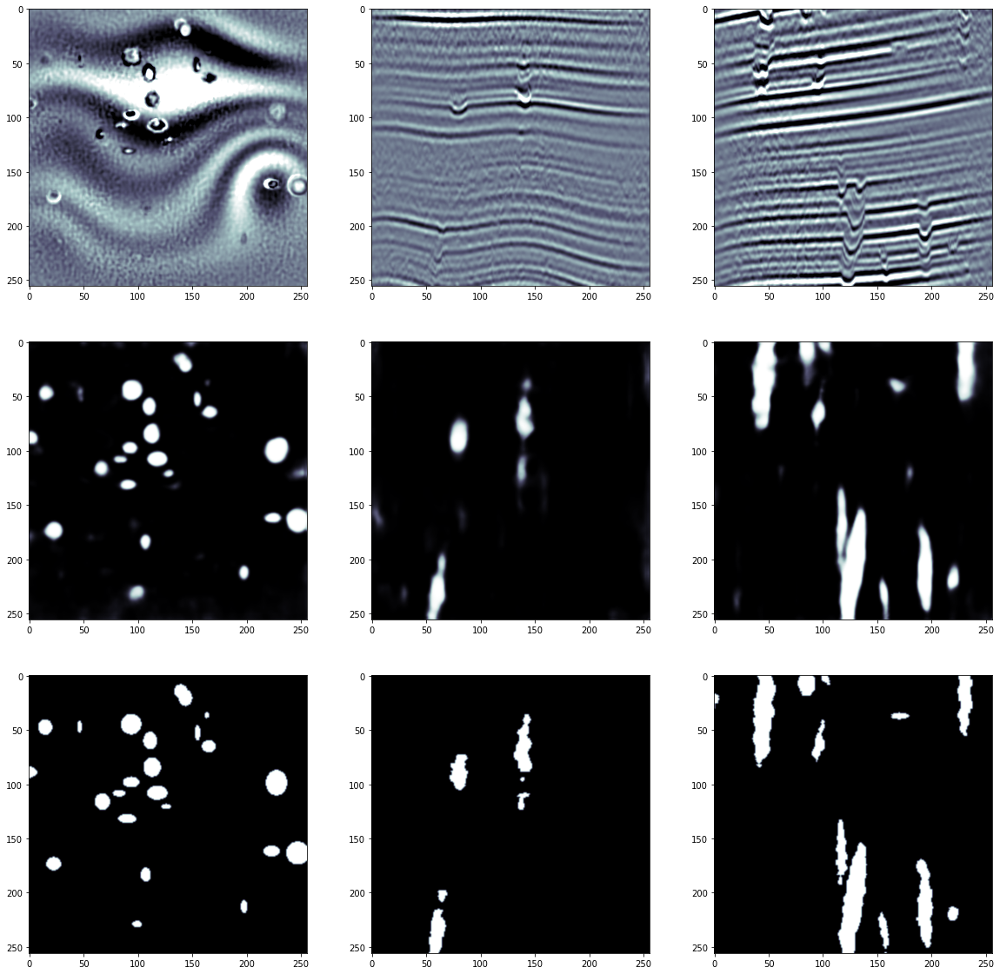

In [20]:
kx = np.fromfile("/media/xinwu/disk-2/karstFW/karst/"+str(k)+".dat",dtype=np.single)
kx = np.reshape(kx,(n1,n2,n3))
kx = np.transpose(kx)
ft = np.transpose(fx)
path = "/media/xinwu/disk-2/karstFW/karst/"+str(k)
ft.tofile(path+"kx.dat")
fig=plt.figure(figsize=(20,20))

#inline slice
k1,k2,k3 = 50,10,100
plt.subplot(3, 3, 1)
imgplot1 = plt.imshow((gt[k1,:,:]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(3, 3, 2)
imgplot2 = plt.imshow((gt[:,k2,:]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(3, 3, 3)
imgplot3 = plt.imshow((gt[:,:,k3]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1)

plt.subplot(3, 3, 4)
imgplot1 = plt.imshow((fx[k1,:,:]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(3, 3, 5)
imgplot2 = plt.imshow((fx[:,k2,:]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(3, 3, 6)
imgplot3 = plt.imshow((fx[:,:,k3]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)

plt.subplot(3, 3, 7)
imgplot1 = plt.imshow((kx[k1,:,:]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(3, 3, 8)
imgplot2 = plt.imshow((kx[:,k2,:]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(3, 3, 9)
imgplot3 = plt.imshow((kx[:,:,k3]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)

In [21]:
import numpy as np
import os
import matplotlib.pyplot as plt
%matplotlib inline
n1,n2,n3,path = 1024,1024,320,"../../data/jie/"
gx = np.fromfile(path+"gg.dat",dtype=np.single)
gx = np.reshape(gx,(1,n1,n2,n3,1))
nt = n1
n1 = n3
n3 = nt
gx = np.transpose(gx)
d1,d2,d3=320,256,256
m1,m2,m3=d1,d2*4,d3*4
gt = np.zeros((m1,m2,m3),dtype=np.single)
fx = np.zeros((m1,m2,m3),dtype=np.single)
for i1 in range(1):
    for i2 in range(4):
        for i3 in range(4):
            b1 = i1*d1
            e1 = b1+d1
            b2 = i2*d2
            b3 = i3*d3
            e2 = b2+d2
            e3 = b3+d3
            xt = gx[:,b1:e1,b2:e2,b3:e3,:]
            xm = np.mean(xt)
            xs = np.std(xt)
            xt = xt-xm
            xt = xt/xs
            gt[b1:e1,b2:e2,b3:e3] = xt[0,:,:,:,0]
            y1= model.predict(xt,verbose=1)
            fx[b1:e1,b2:e2,b3:e3] = y1[0,:,:,:,0]
fxt = np.transpose(fx)
fxt.tofile(path+'kx.dat')

1/1 [==============================] - 2s 2s/step


/home/xinwu/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: invalid value encountered in true_divide


1/1 [==============================] - 2s 2s/step


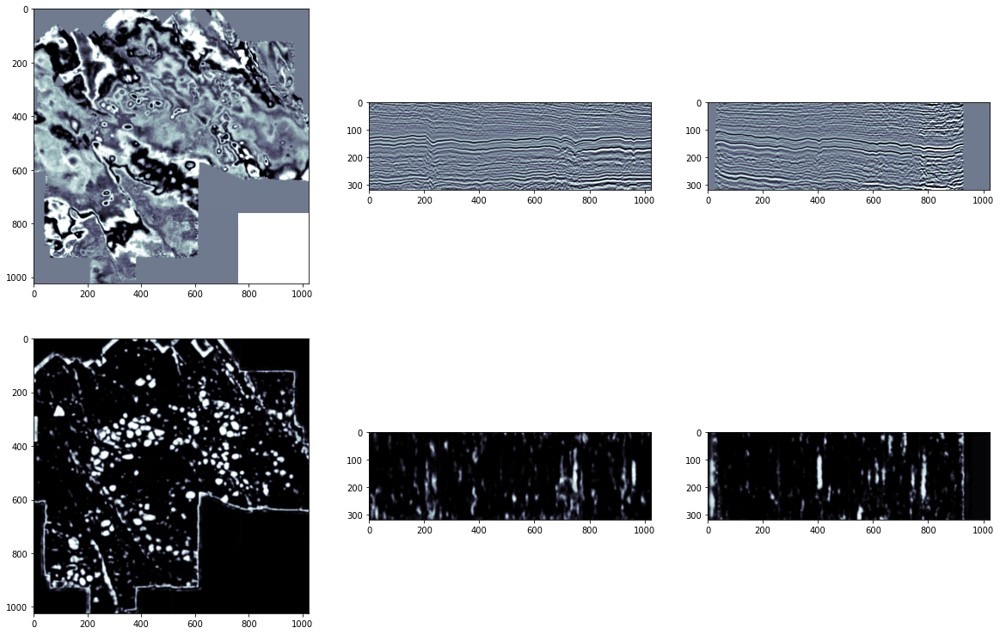

In [22]:
fig=plt.figure(figsize=(20,20))

#inline slice
k1,k2,k3 = 150,512,512
plt.subplot(3, 3, 1)
imgplot1 = plt.imshow((gt[k1,:,:]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(3, 3, 2)
imgplot2 = plt.imshow((gt[:,k2,:]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(3, 3, 3)
imgplot3 = plt.imshow((gt[:,:,k3]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1)

plt.subplot(3, 3, 4)
imgplot1 = plt.imshow((fx[k1,:,:]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(3, 3, 5)
imgplot2 = plt.imshow((fx[:,k2,:]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(3, 3, 6)
imgplot3 = plt.imshow((fx[:,:,k3]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)

In [18]:
import numpy as np
import os
import matplotlib.pyplot as plt
%matplotlib inline
n1,n2,n3,path = 256,256,256,"../../data/hongliu/"
gx = np.fromfile(path+"gc.dat",dtype=np.single)
gx = np.reshape(gx,(1,n1,n2,n3,1))
nt = n1
n1 = n3
n3 = nt
gx = np.transpose(gx)
d1,d2,d3=256,256,256
m1,m2,m3=d1,d2,d3
gt = np.zeros((m1,m2,m3),dtype=np.single)
fx = np.zeros((m1,m2,m3),dtype=np.single)
for i1 in range(1):
    for i2 in range(1):
        for i3 in range(1):
            b1 = i1*d1
            e1 = b1+d1
            b2 = i2*d2
            b3 = i3*d3
            e2 = b2+d2
            e3 = b3+d3
            xt = gx[:,b1:e1,b2:e2,b3:e3,:]
            xm = np.mean(xt)
            xs = np.std(xt)
            xt = xt-xm
            xt = xt/xs
            gt[b1:e1,b2:e2,b3:e3] = xt[0,:,:,:,0]
            y1= model.predict(xt,verbose=1)
            fx[b1:e1,b2:e2,b3:e3] = y1[0,:,:,:,0]
fxt = np.transpose(fx)
gxt = np.transpose(gt)
fxt.tofile(path+'kx.dat')

1/1 [==============================] - 2s 2s/step


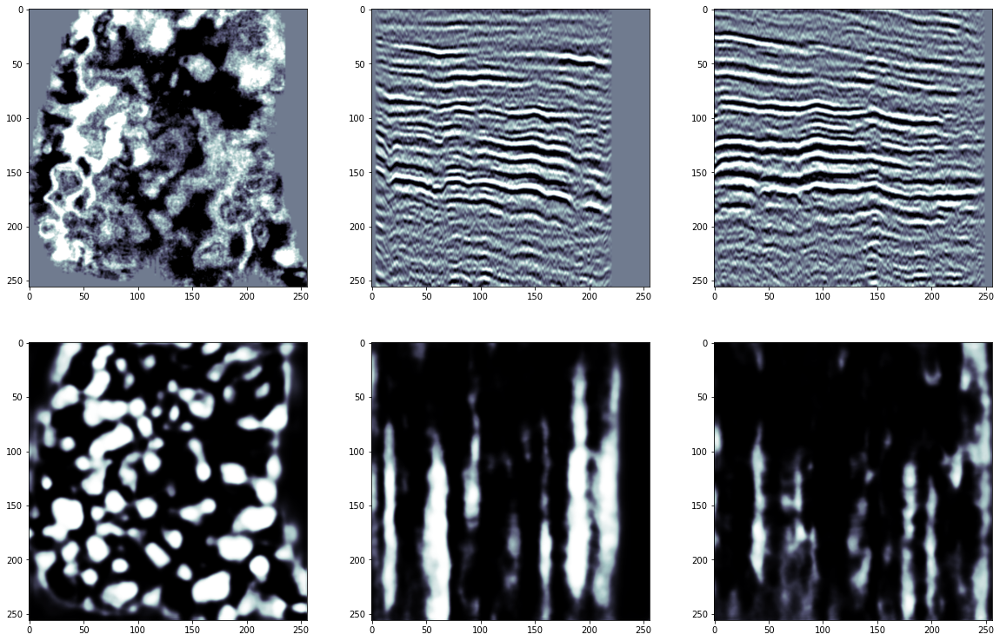

In [19]:
fig=plt.figure(figsize=(20,20))

#inline slice
k1,k2,k3 = 156,128,128
plt.subplot(3, 3, 1)
imgplot1 = plt.imshow((gt[k1,:,:]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(3, 3, 2)
imgplot2 = plt.imshow((gt[:,k2,:]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(3, 3, 3)
imgplot3 = plt.imshow((gt[:,:,k3]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1)

plt.subplot(3, 3, 4)
imgplot1 = plt.imshow((fx[k1,:,:]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(3, 3, 5)
imgplot2 = plt.imshow((fx[:,k2,:]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(3, 3, 6)
imgplot3 = plt.imshow((fx[:,:,k3]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)

In [15]:
import numpy as np
import os
import matplotlib.pyplot as plt
%matplotlib inline
n1,n2,n3,path = 268,303,501,"../../data/hongliu/"
gx = np.fromfile(path+"gg.dat",dtype=np.single)
gx = np.reshape(gx,(1,n1,n2,n3,1))
nt = n1
n1 = n3
n3 = nt
gx = np.transpose(gx)
gc = gx[:,:,20:276,6:262,:]
gx = np.zeros((1,512,256,256,1),dtype=np.single)
gx[:,5:506,:,:,:]=gc[:,:,:,:,:]
d1,d2,d3=256,256,256
m1,m2,m3=d1*2,d2,d3
gt = np.zeros((m1,m2,m3),dtype=np.single)
fx = np.zeros((m1,m2,m3),dtype=np.single)
for i1 in range(2):
    for i2 in range(1):
        for i3 in range(1):
            b1 = i1*d1
            e1 = b1+d1
            b2 = i2*d2
            b3 = i3*d3
            e2 = b2+d2
            e3 = b3+d3
            xt = gx[:,b1:e1,b2:e2,b3:e3,:]
            xm = np.mean(xt)
            xs = np.std(xt)
            xt = xt-xm
            xt = xt/xs
            gt[b1:e1,b2:e2,b3:e3] = xt[0,:,:,:,0]
            y1= model.predict(xt,verbose=1)
            fx[b1:e1,b2:e2,b3:e3] = y1[0,:,:,:,0]
fxt = np.transpose(fx)
#fxt.tofile(path+'kx.dat')

1/1 [==============================] - 2s 2s/step


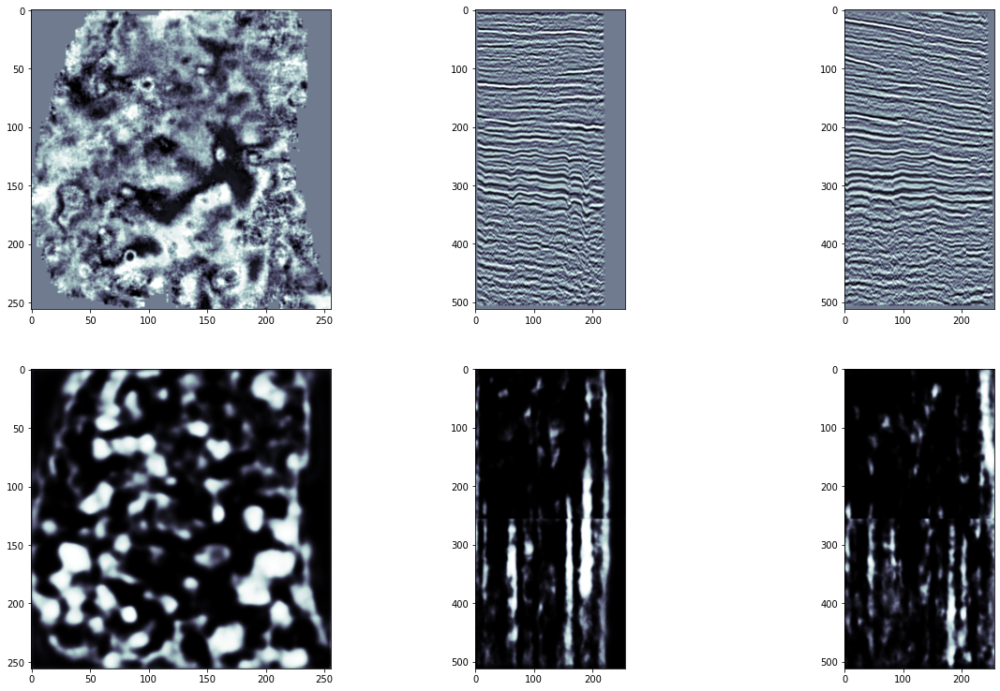

In [16]:
fig=plt.figure(figsize=(20,20))

#inline slice
k1,k2,k3 = 256,128,128
plt.subplot(3, 3, 1)
imgplot1 = plt.imshow((gt[k1,:,:]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(3, 3, 2)
imgplot2 = plt.imshow((gt[:,k2,:]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(3, 3, 3)
imgplot3 = plt.imshow((gt[:,:,k3]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1)

plt.subplot(3, 3, 4)
imgplot1 = plt.imshow((fx[k1,:,:]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(3, 3, 5)
imgplot2 = plt.imshow((fx[:,k2,:]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(3, 3, 6)
imgplot3 = plt.imshow((fx[:,:,k3]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)

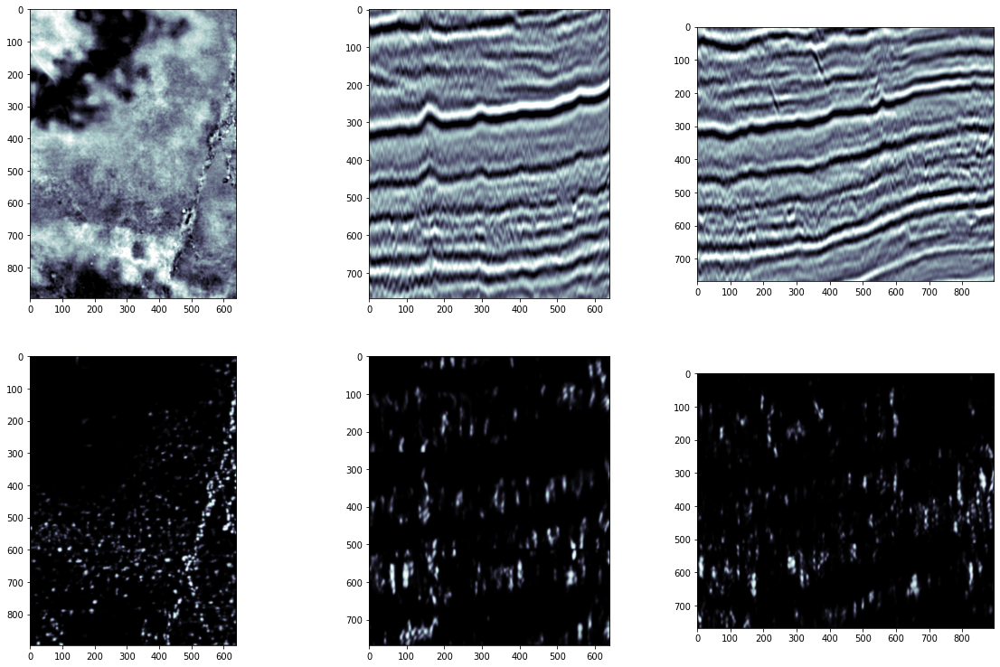

In [7]:
fig=plt.figure(figsize=(20,20))

#inline slice
k1,k2,k3 = 300,10,100
plt.subplot(3, 3, 1)
imgplot1 = plt.imshow((gt[k1,:,:]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(3, 3, 2)
imgplot2 = plt.imshow((gt[:,k2,:]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(3, 3, 3)
imgplot3 = plt.imshow((gt[:,:,k3]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1)

plt.subplot(3, 3, 4)
imgplot1 = plt.imshow((fx[k1,:,:]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(3, 3, 5)
imgplot2 = plt.imshow((fx[:,k2,:]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(3, 3, 6)
imgplot3 = plt.imshow((fx[:,:,k3]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)

1/1 [==============================] - 1s 866ms/step


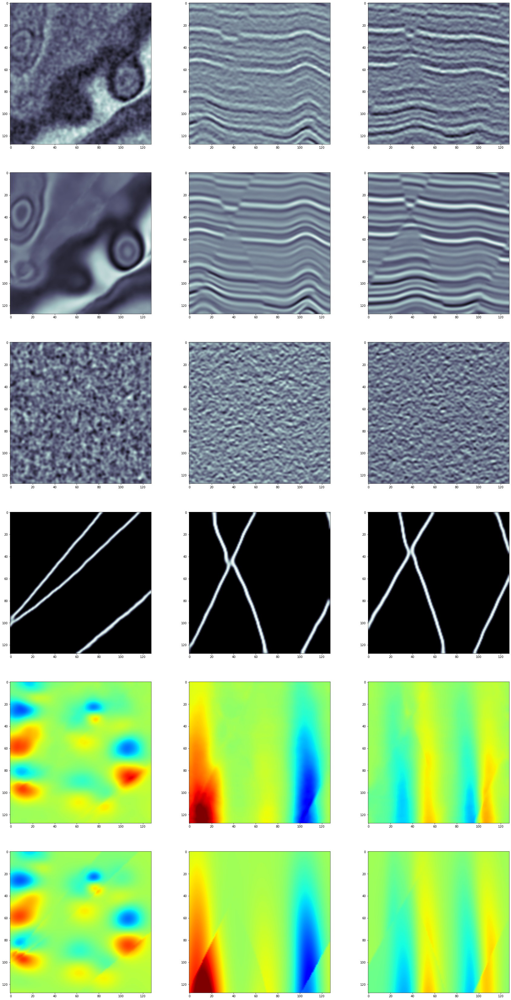

In [5]:
import numpy as np
import os
import matplotlib.pyplot as plt
%matplotlib inline
nxPath = '../../efault/data/lspTrain/noise/'
cxPath = '../../efault/data/lspTrain/clean/'
u1Path = '../../efault/data/lspTrain/u1/'
u2Path = '../../efault/data/lspTrain/u2/'
u3Path = '../../efault/data/lspTrain/u3/'
fxPath = '../../efault/data/lspTrain/fault/'

fn = str(86)+'.dat'
nx = np.fromfile(nxPath+fn,dtype=np.single)
cx = np.fromfile(cxPath+fn,dtype=np.single)
u1 = np.fromfile(u1Path+fn,dtype=np.single)
u2 = np.fromfile(u2Path+fn,dtype=np.single)
u3 = np.fromfile(u3Path+fn,dtype=np.single)
fx = np.fromfile(fxPath+fn,dtype=np.single)
xs = np.std(nx)
xm = np.mean(nx)
nx = nx-xm
nx = nx/xs
x = np.reshape(nx,(1,128,128,128,1))
u1 = np.reshape(u1,(128,128,128))
u2 = np.reshape(u2,(128,128,128))
u3 = np.reshape(u3,(128,128,128))
x = np.transpose(x)
u1 = np.transpose(u1)
u2 = np.transpose(u2)
u3 = np.transpose(u3)

y1,y2,y3= model.predict(x,verbose=1)
v1 = y3[0,:,:,:,0]
v2 = y3[0,:,:,:,1]
v3 = y3[0,:,:,:,2]
vs = np.sqrt(v1*v1+v2*v2+v3*v3)
v1 = v1/vs
v2 = v2/vs
v3 = v3/vs
dxy2 = x-y2
o1 = y1[0,:,:,:,0]
o1 = np.transpose(o1)
o2 = y2[0,:,:,:,0]
o2 = np.transpose(o2)
v1t = np.transpose(v1)
v2t = np.transpose(v2)
v3t = np.transpose(v3)
#xt = x[0,:,:,:,0]
o1.tofile('check18/fake/sx.dat')
o1.tofile('check18/fake/o1.dat')
o2.tofile('check18/fake/o2.dat')
v1t.tofile('check18/fake/v1.dat')
v2t.tofile('check18/fake/v2.dat')
v3t.tofile('check18/fake/v3.dat')
p2 = -v2/v1
p3 = -v3/v1
p2t = -u2/u1
p3t = -u3/u1
k1,k2,k3=64,64,64
fig = plt.figure(figsize=(30,60))
plt.subplot(6, 3, 1)
plt.imshow((x[0,k1,:,:,0]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(6, 3, 2)
plt.imshow((x[0,:,k2,:,0]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(6, 3, 3)
plt.imshow((x[0,:,:,k3,0]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)

plt.subplot(6, 3, 4)
plt.imshow((y2[0,k1,:,:,0]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(6, 3, 5)
plt.imshow((y2[0,:,k2,:,0]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(6, 3, 6)
plt.imshow((y2[0,:,:,k3,0]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)

plt.subplot(6, 3, 7)
plt.imshow((dxy2[0,k1,:,:,0]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(6, 3, 8)
plt.imshow((dxy2[0,:,k2,:,0]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(6, 3, 9)
plt.imshow((dxy2[0,:,:,k3,0]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)

plt.subplot(6, 3, 10)
plt.imshow((y1[0,k1,:,:,0]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(6, 3, 11)
plt.imshow((y1[0,:,k2,:,0]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(6, 3, 12)
plt.imshow((y1[0,:,:,k3,0]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)

plt.subplot(6, 3, 13)
plt.imshow((p2[k1,:,:]),vmin=-1,vmax=1.0,cmap=plt.cm.jet,interpolation='bicubic',aspect=1)
plt.subplot(6, 3, 14)
plt.imshow((p2[:,k2,:]),vmin=-1,vmax=1.0,cmap=plt.cm.jet,interpolation='bicubic',aspect=1)
plt.subplot(6, 3, 15)
plt.imshow((p2[:,:,k3]),vmin=-1,vmax=1.0,cmap=plt.cm.jet,interpolation='bicubic',aspect=1)

plt.subplot(6, 3, 16)
plt.imshow((p2t[k1,:,:]),vmin=-1,vmax=1.0,cmap=plt.cm.jet,interpolation='bicubic',aspect=1)
plt.subplot(6, 3, 17)
plt.imshow((p2t[:,k2,:]),vmin=-1,vmax=1.0,cmap=plt.cm.jet,interpolation='bicubic',aspect=1)
plt.subplot(6, 3, 18)
plt.imshow((p2t[:,:,k3]),vmin=-1,vmax=1.0,cmap=plt.cm.jet,interpolation='bicubic',aspect=1)

1/1 [==============================] - 2s 2s/step


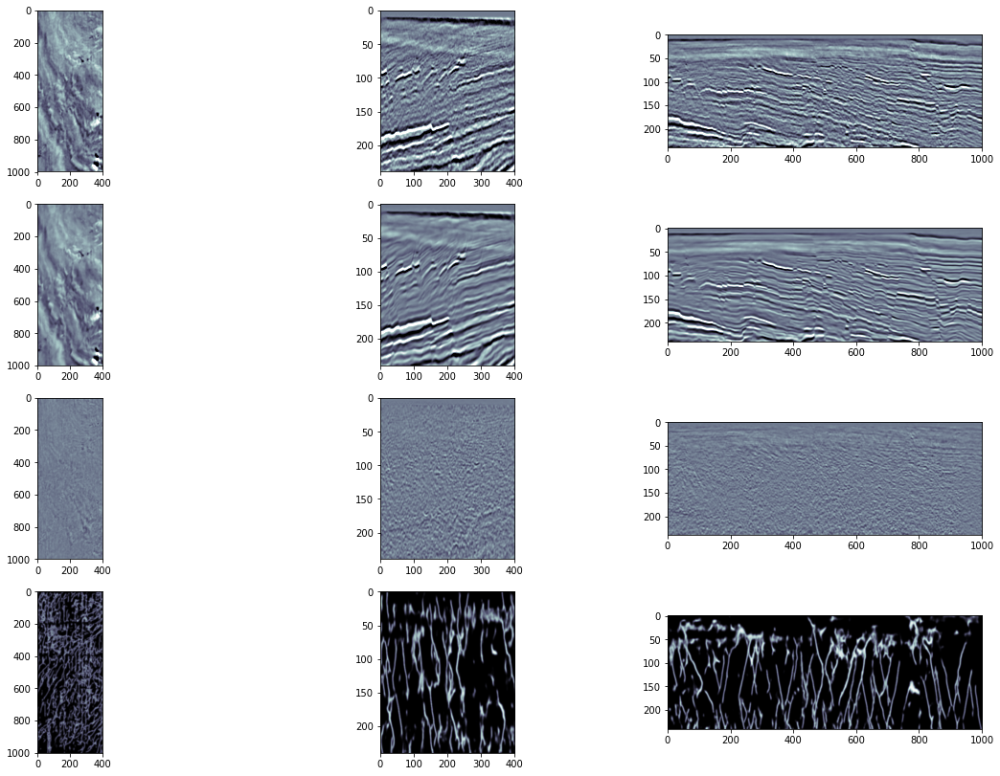

In [20]:
import numpy as np
import os
import matplotlib.pyplot as plt
%matplotlib inline
#path = '../../efault/data/prediction/westCam/'
path = 'data/pred/crf/'
#n1,n2,n3,gx = 210,381,1001,np.fromfile(path+'gxl.dat',dtype=np.single)
n1,n2,n3,gx = 400,1000,250,np.fromfile(path+'gxCrfL.dat',dtype=np.single)
x = np.reshape(gx,(1,n1,n2,n3,1))
o1 = np.zeros((240,1000,400),dtype=np.single)
o2 = np.zeros((240,1000,400),dtype=np.single)
v1 = np.zeros((240,1000,400),dtype=np.single)
v2 = np.zeros((240,1000,400),dtype=np.single)
v3 = np.zeros((240,1000,400),dtype=np.single)
sx = np.zeros((240,1000,400),dtype=np.single)

for i1 in range(2):
    for i2 in range(5):
        k1 = i1*200
        k2 = i2*200
        xt = x[:,k1:k1+200,k2:k2+200,10:250,:]
        xt = np.transpose(xt)
        xm = np.mean(xt)
        xs = np.std(xt)
        xt = xt-xm
        xt = xt/xs
        sx[:,k2:k2+200,k1:k1+200] = xt[0,:,:,:,0]
        y1,y2,y3= model.predict(xt,verbose=1)
        y31 = y3[0,:,:,:,0]*y3[0,:,:,:,0]
        y32 = y3[0,:,:,:,1]*y3[0,:,:,:,1]
        y33 = y3[0,:,:,:,2]*y3[0,:,:,:,2]
        y3s = np.sqrt(y31+y32+y33)
        o1[:,k2:k2+200,k1:k1+200] = y1[0,:,:,:,0]
        o2[:,k2:k2+200,k1:k1+200] = y2[0,:,:,:,0]
        v1[:,k2:k2+200,k1:k1+200] = y3[0,:,:,:,0]/y3s
        v2[:,k2:k2+200,k1:k1+200] = y3[0,:,:,:,1]/y3s
        v3[:,k2:k2+200,k1:k1+200] = y3[0,:,:,:,2]/y3s
o1t = np.transpose(o1)
o2t = np.transpose(o2)
v1t = np.transpose(v1)
v2t = np.transpose(v2)
v3t = np.transpose(v3)
sxt = np.transpose(sx)
sxt.tofile('data/pred/crf/check18/sx.dat')
o1t.tofile('data/pred/crf/check18/o1.dat')
o2t.tofile('data/pred/crf/check18/o2.dat')
v1t.tofile('data/pred/crf/check18/v1.dat')
v2t.tofile('data/pred/crf/check18/v2.dat')
v3t.tofile('data/pred/crf/check18/v3.dat')
dxy2 = sx-o2
fig = plt.figure(figsize=(20,18))
#inline slice
k1,k2,k3 = 50,10,100
plt.subplot(5, 3, 1)
imgplot1 = plt.imshow((sx[k1,:,:]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(5, 3, 2)
imgplot2 = plt.imshow((sx[:,k2,:]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=2)
plt.subplot(5, 3, 3)
imgplot3 = plt.imshow((sx[:,:,k3]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1.5)

plt.subplot(5, 3, 4)
imgplot1 = plt.imshow((o2[k1,:,:]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(5, 3, 5)
imgplot2 = plt.imshow((o2[:,k2,:]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=2)
plt.subplot(5, 3, 6)
imgplot3 = plt.imshow((o2[:,:,k3]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1.5)

plt.subplot(5, 3, 7)
plt.imshow((dxy2[k1,:,:]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(5, 3, 8)
plt.imshow((dxy2[:,k2,:]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=2)
plt.subplot(5, 3, 9)
plt.imshow((dxy2[:,:,k3]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1.5)

plt.subplot(5, 3, 10)
imgplot1 = plt.imshow((o1[k1,:,:]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(5, 3, 11)
imgplot2 = plt.imshow((o1[:,k2,:]),cmap=plt.cm.bone,interpolation='bicubic',aspect=2)
plt.subplot(5, 3, 12)
imgplot3 = plt.imshow((o1[:,:,k3]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1.5)

1/1 [==============================] - 3s 3s/step


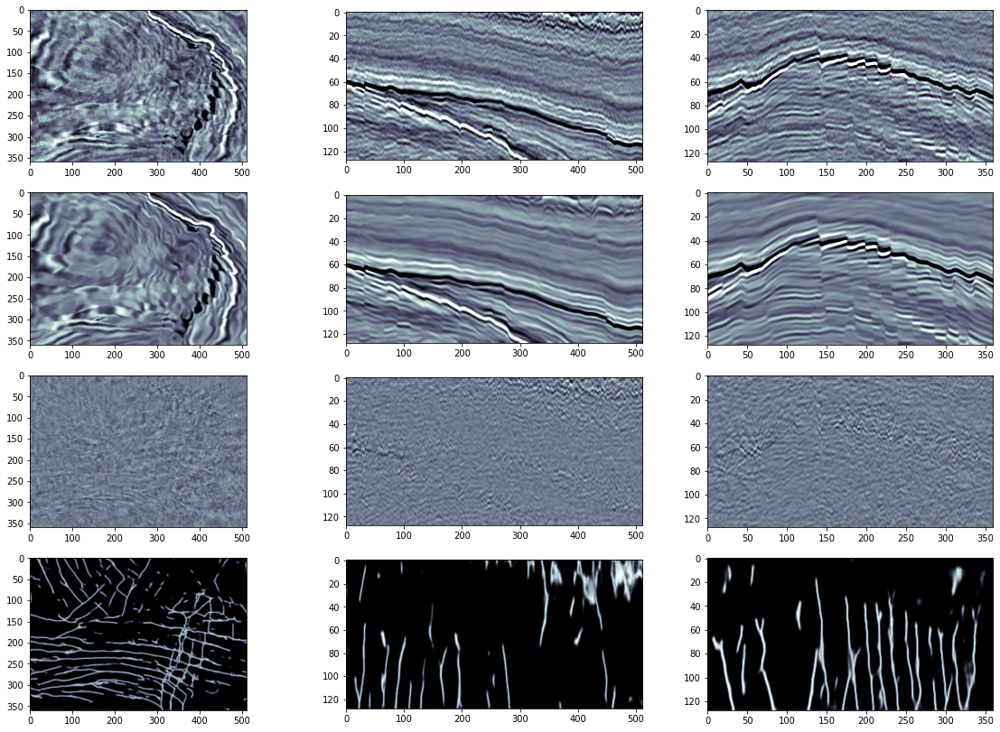

In [6]:
import numpy as np
import os
import matplotlib.pyplot as plt
%matplotlib inline
path = '../../efault/data/prediction/f3d/'
#n1,n2,n3,gx = 210,381,1001,np.fromfile(path+'gxl.dat',dtype=np.single)
n1,n2,n3,gx = 512,384,128,np.fromfile(path+'gxl.dat',dtype=np.single)
x = np.reshape(gx,(1,n1,n2,n3,1))
x = x[:,:,0:360,:,:]
o1 = np.zeros((128,360,512),dtype=np.single)
o2 = np.zeros((128,360,512),dtype=np.single)
v1 = np.zeros((128,360,512),dtype=np.single)
v2 = np.zeros((128,360,512),dtype=np.single)
v3 = np.zeros((128,360,512),dtype=np.single)
sx = np.zeros((128,360,512),dtype=np.single)
for i1 in range(2):
    for i2 in range(1):
        k1 = i1*256
        k2 = i2*360
        xt = x[:,k1:k1+256,k2:k2+360,:,:]
        xt = np.transpose(xt)
        xm = np.mean(xt)
        xs = np.std(xt)
        xt = xt-xm
        xt = xt/xs
        sx[:,k2:k2+360,k1:k1+256] = xt[0,:,:,:,0]
        y1,y2,y3= model.predict(xt,verbose=1)
        y31 = y3[0,:,:,:,0]*y3[0,:,:,:,0]
        y32 = y3[0,:,:,:,1]*y3[0,:,:,:,1]
        y33 = y3[0,:,:,:,2]*y3[0,:,:,:,2]
        y3s = np.sqrt(y31+y32+y33)
        o1[:,k2:k2+360,k1:k1+256] = y1[0,:,:,:,0]
        o2[:,k2:k2+360,k1:k1+256] = y2[0,:,:,:,0]
        v1[:,k2:k2+360,k1:k1+256] = y3[0,:,:,:,0]/y3s
        v2[:,k2:k2+360,k1:k1+256] = y3[0,:,:,:,1]/y3s
        v3[:,k2:k2+360,k1:k1+256] = y3[0,:,:,:,2]/y3s
o1t = np.transpose(o1)
o2t = np.transpose(o2)
v1t = np.transpose(v1)
v2t = np.transpose(v2)
v3t = np.transpose(v3)
sxt = np.transpose(sx)
sxt.tofile('data/pred/f3d/check18/sx.dat')
o1t.tofile('data/pred/f3d/check18/o1.dat')
o2t.tofile('data/pred/f3d/check18/o2.dat')
v1t.tofile('data/pred/f3d/check18/v1.dat')
v2t.tofile('data/pred/f3d/check18/v2.dat')
v3t.tofile('data/pred/f3d/check18/v3.dat')
dxy2 = sx-o2
fig = plt.figure(figsize=(20,18))
#inline slice
k1,k2,k3 = 120,10,100
plt.subplot(5, 3, 1)
imgplot1 = plt.imshow((sx[k1,:,:]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(5, 3, 2)
imgplot2 = plt.imshow((sx[:,k2,:]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=2)
plt.subplot(5, 3, 3)
imgplot3 = plt.imshow((sx[:,:,k3]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1.5)

plt.subplot(5, 3, 4)
imgplot1 = plt.imshow((o2[k1,:,:]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(5, 3, 5)
imgplot2 = plt.imshow((o2[:,k2,:]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=2)
plt.subplot(5, 3, 6)
imgplot3 = plt.imshow((o2[:,:,k3]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1.5)

plt.subplot(5, 3, 7)
plt.imshow((dxy2[k1,:,:]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(5, 3, 8)
plt.imshow((dxy2[:,k2,:]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=2)
plt.subplot(5, 3, 9)
plt.imshow((dxy2[:,:,k3]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1.5)

plt.subplot(5, 3, 10)
imgplot1 = plt.imshow((o1[k1,:,:]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(5, 3, 11)
imgplot2 = plt.imshow((o1[:,k2,:]),cmap=plt.cm.bone,interpolation='bicubic',aspect=2)
plt.subplot(5, 3, 12)
imgplot3 = plt.imshow((o1[:,:,k3]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1.5)

1/1 [==============================] - 3s 3s/step


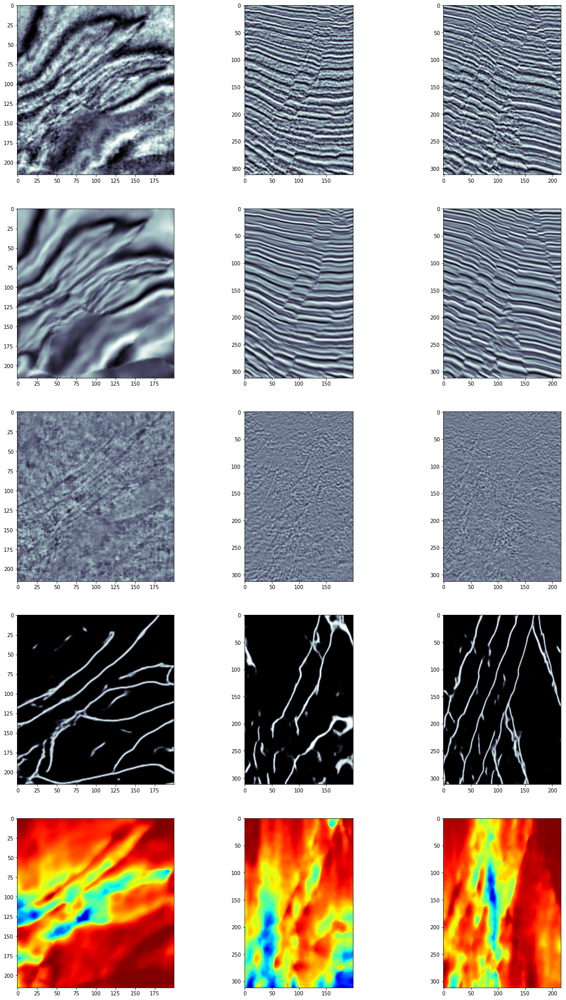

In [24]:
import numpy as np
import os
import matplotlib.pyplot as plt
%matplotlib inline
path = '../../efault/data/prediction/westCam/'
n1,n2,n3,gx = 210,381,1001,np.fromfile(path+'gxl.dat',dtype=np.single)
x = np.reshape(gx,(1,n1,n2,n3,1))
x = x[:,0:200,0:216,392:704,:]
#x = x[:,:,164:380,0:128,:]
x = np.transpose(x)
xm = np.mean(x)
xs = np.std(x)
x = x-xm
x = x/xs
y1,y2,y3= model.predict(x,verbose=1)
y31 = y3[0,:,:,:,0]*y3[0,:,:,:,0]
y32 = y3[0,:,:,:,1]*y3[0,:,:,:,1]
y33 = y3[0,:,:,:,2]*y3[0,:,:,:,2]
y3s = np.sqrt(y31+y32+y33)
u1 = y3[0,:,:,:,0]/y3s
u2 = y3[0,:,:,:,1]/y3s
u3 = y3[0,:,:,:,2]/y3s

o1 = y1[0,:,:,:,0]
o1 = np.transpose(o1)
o2 = y2[0,:,:,:,0]
o2 = np.transpose(o2)
v1t = np.transpose(u1)
v2t = np.transpose(u2)
v3t = np.transpose(u3)
o1.tofile('check18/westCam/o1.dat')
o2.tofile('check18/westCam/o2.dat')
v1t.tofile('check18/westCam/v1.dat')
v2t.tofile('check18/westCam/v2.dat')
v3t.tofile('check18/westCam/v3.dat')
dxy2 = x-y2
fig = plt.figure(figsize=(20,35))
#inline slice
k1,k2,k3 = 120,50,120
plt.subplot(5, 3, 1)
imgplot1 = plt.imshow((x[0,k1,:,:,0]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(5, 3, 2)
imgplot2 = plt.imshow((x[0,:,k2,:,0]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(5, 3, 3)
imgplot3 = plt.imshow((x[0,:,:,k3,0]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1)

plt.subplot(5, 3, 4)
imgplot1 = plt.imshow((y2[0,k1,:,:,0]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(5, 3, 5)
imgplot2 = plt.imshow((y2[0,:,k2,:,0]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(5, 3, 6)
imgplot3 = plt.imshow((y2[0,:,:,k3,0]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1)

plt.subplot(5, 3, 7)
plt.imshow((dxy2[0,k1,:,:,0]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(5, 3, 8)
plt.imshow((dxy2[0,:,k2,:,0]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(5, 3, 9)
plt.imshow((dxy2[0,:,:,k3,0]),vmin=-2,vmax=2,cmap=plt.cm.bone,interpolation='bicubic',aspect=1)

plt.subplot(5, 3, 10)
imgplot1 = plt.imshow((y1[0,k1,:,:,0]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(5, 3, 11)
imgplot2 = plt.imshow((y1[0,:,k2,:,0]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)
plt.subplot(5, 3, 12)
imgplot3 = plt.imshow((y1[0,:,:,k3,0]),cmap=plt.cm.bone,interpolation='bicubic',aspect=1)

plt.subplot(5, 3, 13)
imgplot1 = plt.imshow((u1[k1,:,:]),cmap=plt.cm.jet,interpolation='bicubic',aspect=1)
plt.subplot(5, 3, 14)
imgplot2 = plt.imshow((u1[:,k2,:]),cmap=plt.cm.jet,interpolation='bicubic',aspect=1)
plt.subplot(5, 3, 15)
imgplot3 = plt.imshow((u1[:,:,k3]),cmap=plt.cm.jet,interpolation='bicubic',aspect=1)



1/1 [==============================] - 3s 3s/step


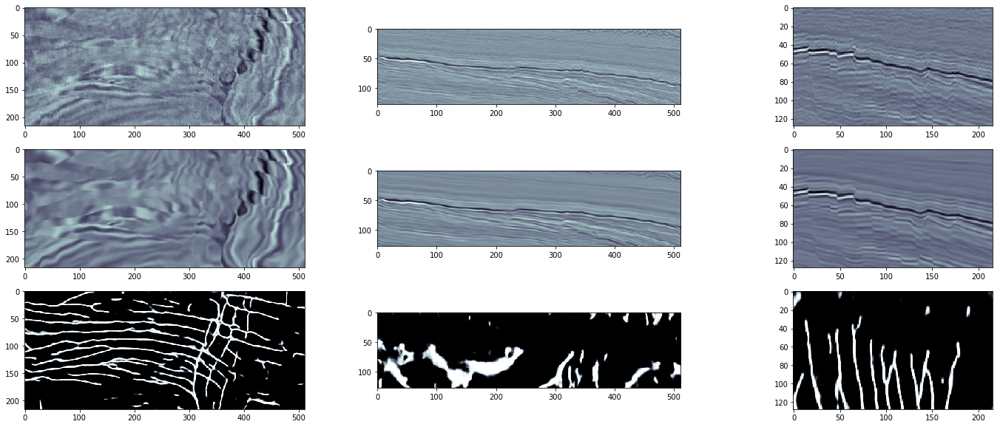

In [10]:
import numpy as np
import os
import matplotlib.pyplot as plt
%matplotlib inline
#path = '../../efault/data/prediction/westCam/'
path = '../../efault/data/prediction/f3d/'
#n1,n2,n3,gx = 210,381,1001,np.fromfile(path+'gxl.dat',dtype=np.single)
n1,n2,n3,gx = 512,384,128,np.fromfile(path+'gxl.dat',dtype=np.single)
x = np.reshape(gx,(1,n1,n2,n3,1))
#x = x[:,0:200,0:216,392:704,:]
x = x[:,:,164:380,0:128,:]
x = np.transpose(x)
xm = np.mean(x)
xs = np.std(x)
x = x-xm
x = x/xs
y1,y2,y3= model.predict(x,verbose=1)

fig = plt.figure(figsize=(25,10))
#inline slice
k1,k2,k3 = 120,100,120
plt.subplot(3, 3, 1)
imgplot1 = plt.imshow((x[0,k1,:,:,0]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)
plt.subplot(3, 3, 2)
imgplot2 = plt.imshow((x[0,:,k2,:,0]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)
plt.subplot(3, 3, 3)
imgplot3 = plt.imshow((x[0,:,:,k3,0]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)

plt.subplot(3, 3, 4)
imgplot1 = plt.imshow((y2[0,k1,:,:,0]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)
plt.subplot(3, 3, 5)
imgplot2 = plt.imshow((y2[0,:,k2,:,0]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)
plt.subplot(3, 3, 6)
imgplot3 = plt.imshow((y2[0,:,:,k3,0]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)

plt.subplot(3, 3, 7)
imgplot1 = plt.imshow((y1[0,k1,:,:,0]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)
plt.subplot(3, 3, 8)
imgplot2 = plt.imshow((y1[0,:,k2,:,0]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)
plt.subplot(3, 3, 9)
imgplot3 = plt.imshow((y1[0,:,:,k3,0]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)

1/1 [==============================] - 5s 5s/step


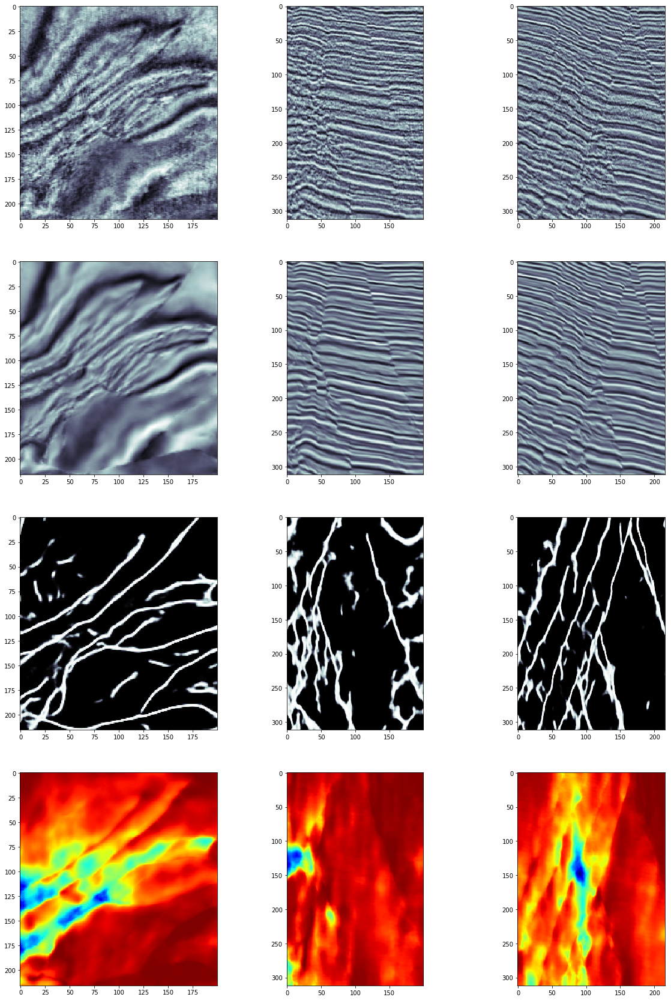

In [31]:
import numpy as np
import os
import matplotlib.pyplot as plt
%matplotlib inline
path = '../../efault/data/prediction/westCam/'
n1,n2,n3,gx = 210,381,1001,np.fromfile(path+'gxl.dat',dtype=np.single)
x = np.reshape(gx,(1,n1,n2,n3,1))
x = x[:,0:200,0:216,392:704,:]
#x = x[:,:,164:380,0:128,:]
x = np.transpose(x)
xm = np.mean(x)
xs = np.std(x)
x = x-xm
x = x/xs
y1,y2,y3= model.predict(x,verbose=1)
y31 = y3[0,:,:,:,0]*y3[0,:,:,:,0]
y32 = y3[0,:,:,:,1]*y3[0,:,:,:,1]
y33 = y3[0,:,:,:,2]*y3[0,:,:,:,2]
y3s = np.sqrt(y31+y32+y33)
u1 = y3[0,:,:,:,0]/y3s
u2 = y3[0,:,:,:,1]/y3s
u3 = y3[0,:,:,:,2]/y3s

fig = plt.figure(figsize=(20,30))
#inline slice
k1,k2,k3 = 120,170,120
plt.subplot(4, 3, 1)
imgplot1 = plt.imshow((x[0,k1,:,:,0]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)
plt.subplot(4, 3, 2)
imgplot2 = plt.imshow((x[0,:,k2,:,0]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)
plt.subplot(4, 3, 3)
imgplot3 = plt.imshow((x[0,:,:,k3,0]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)

plt.subplot(4, 3, 4)
imgplot1 = plt.imshow((y2[0,k1,:,:,0]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)
plt.subplot(4, 3, 5)
imgplot2 = plt.imshow((y2[0,:,k2,:,0]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)
plt.subplot(4, 3, 6)
imgplot3 = plt.imshow((y2[0,:,:,k3,0]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)

plt.subplot(4, 3, 7)
imgplot1 = plt.imshow((y1[0,k1,:,:,0]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)
plt.subplot(4, 3, 8)
imgplot2 = plt.imshow((y1[0,:,k2,:,0]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)
plt.subplot(4, 3, 9)
imgplot3 = plt.imshow((y1[0,:,:,k3,0]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)

plt.subplot(4, 3, 10)
imgplot1 = plt.imshow((u1[k1,:,:]),cmap=plt.cm.jet,interpolation='nearest',aspect=1)
plt.subplot(4, 3, 11)
imgplot2 = plt.imshow((u1[:,k2,:]),cmap=plt.cm.jet,interpolation='nearest',aspect=1)
plt.subplot(4, 3, 12)
imgplot3 = plt.imshow((u1[:,:,k3]),cmap=plt.cm.jet,interpolation='nearest',aspect=1)

1/1 [==============================] - 3s 3s/step


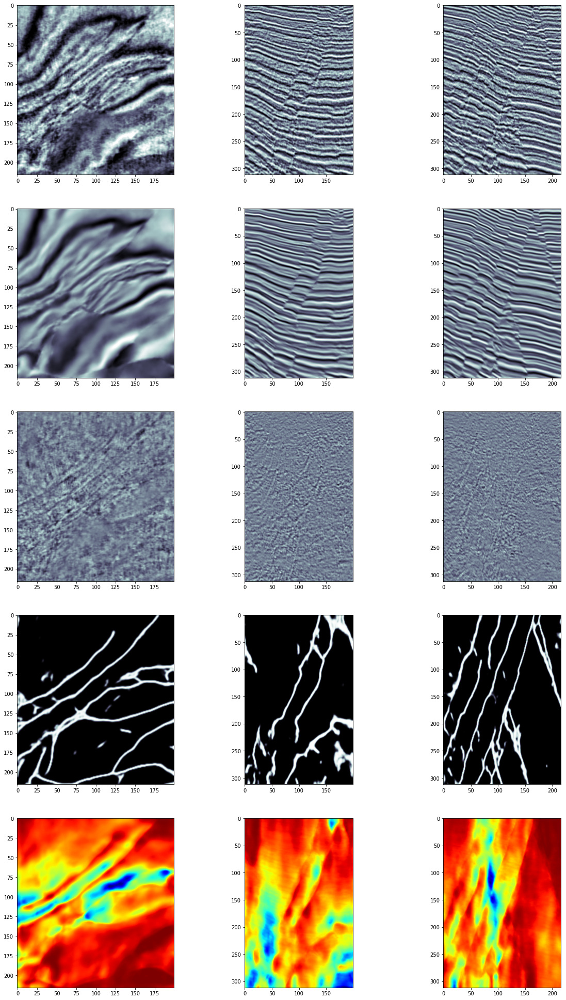

In [ ]:
import numpy as np
import plotly.plotly as py
from plotly.graph_objs import *

path = '../../efault/data/prediction/westCam/'
#path = '../../efault/data/prediction/f3d/'
n1,n2,n3,gx = 210,381,1001,np.fromfile(path+'gxl.dat',dtype=np.single)
#n1,n2,n3,gx = 512,384,128,np.fromfile(path+'gxl.dat',dtype=np.single)
x = np.reshape(gx,(1,n1,n2,n3,1))
volume = x[0,0:200,0:240,400:720,0]

#py.sign_in('empet', 'my_api_key')

pl_bone = [
    [0.0, 'rgb(0, 0, 0)'],
    [0.05, 'rgb(10, 10, 14)'],
    [0.1, 'rgb(21, 21, 30)'],
    [0.15, 'rgb(33, 33, 46)'],
    [0.2, 'rgb(44, 44, 62)'],
    [0.25, 'rgb(56, 55, 77)'],
    [0.3, 'rgb(66, 66, 92)'],
    [0.35, 'rgb(77, 77, 108)'],
    [0.4, 'rgb(89, 92, 121)'],
    [0.45, 'rgb(100, 107, 132)'],
    [0.5, 'rgb(112, 123, 143)'],
    [0.55, 'rgb(122, 137, 154)'],
    [0.6, 'rgb(133, 153, 165)'],
    [0.65, 'rgb(145, 169, 177)'],
    [0.7, 'rgb(156, 184, 188)'],
    [0.75, 'rgb(168, 199, 199)'],
    [0.8, 'rgb(185, 210, 210)'],
    [0.85, 'rgb(203, 221, 221)'],
    [0.9, 'rgb(220, 233, 233)'],
    [0.95, 'rgb(238, 244, 244)'],
    [1.0, 'rgb(255, 255, 255)']
]

def get_the_slice(x,y,z, surfacecolor,  colorscale=pl_bone, showscale=False):
    return Surface(x=x,# https://plot.ly/python/reference/#surface
                   y=y,
                   z=z,
                   surfacecolor=surfacecolor,
                   colorscale=colorscale,
                   showscale=showscale)

def get_lims_colors(surfacecolor):# color limits for a slice
    return np.min(surfacecolor), np.max(surfacecolor)

x=np.linspace(0,200, 200)
y=np.linspace(0,240, 240)
x,y=np.meshgrid(x,y)
z=np.zeros(x.shape)
surfcolor_z=volume[:,:,0]
sminz, smaxz=get_lims_colors(surfcolor_z)

slice_z=get_the_slice(x,y,z, surfcolor_z)

x=np.linspace(0,200, 200)
z=np.linspace(0,320, 320)
x,z=np.meshgrid(x,y)
y=-0.5*np.ones(x.shape)
surfcolor_y=volume[:,160,:]
sminy, smaxy=get_lims_colors(surfcolor_y)
vmin=min([sminz, sminy])
vmax=max([smaxz, smaxy])
slice_y=get_the_slice(x,y,z, surfcolor_y)

slice_z.update(cmin=vmin, cmax=vmax)
slice_y.update(cmin=vmin, cmax=vmax, showscale=True)

axis = dict(showbackground=True, 
            backgroundcolor="rgb(230, 230,230)",
            gridcolor="rgb(255, 255, 255)",      
            zerolinecolor="rgb(255, 255, 255)",  
            )


layout = Layout(
         title='Slices in volumetric data', 
         width=700,
         height=700,
         scene=Scene(xaxis=XAxis(axis),
                     yaxis=YAxis(axis), 
                     zaxis=ZAxis(axis, range=[-2,2]), 
                     aspectratio=dict(x=1,
                                      y=1, 
                                      z=1
                                     ),
                    )
        )
fig=Figure(data=Data([slice_z,slice_y]), layout=layout)
py.iplot(fig, filename='Slice-volumetric-1')

In [ ]:
import numpy as np
import os
import matplotlib.pyplot as plt
%matplotlib inline
nxPath = '../../efault/data/lspTrain/noise/'
cxPath = '../../efault/data/lspTrain/clean/'
u1Path = '../../efault/data/lspTrain/u1/'
u2Path = '../../efault/data/lspTrain/u2/'
u3Path = '../../efault/data/lspTrain/u3/'
fxPath = '../../efault/data/lspTrain/fault/'

files = os.listdir(nxPath)
for fk in range(2):
    fn = files[fk]
    nx = np.fromfile(nxPath+fn,dtype=np.single)
    cx = np.fromfile(cxPath+fn,dtype=np.single)
    u1 = np.fromfile(u1Path+fn,dtype=np.single)
    u2 = np.fromfile(u2Path+fn,dtype=np.single)
    u3 = np.fromfile(u3Path+fn,dtype=np.single)
    fx = np.fromfile(fxPath+fn,dtype=np.single)
    x = np.reshape(nx,(128,128,128))
    Y = np.reshape(fx,(128,128,128))
    x = np.rot90(x,1,(0,1))
    Y = np.rot90(Y,1,(0,1))
    
    k = 50

    fig = plt.figure(figsize=(20,20))
    #inline slice
    k1 = 50
    plt.subplot(1, 6, 1)
    imgplot1 = plt.imshow(np.transpose(x[k,:,:]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)
    plt.subplot(1, 6, 2)
    imgplot2 = plt.imshow(np.transpose(Y[k,:,:]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)
    #xline slice
    k2 = 110
    plt.subplot(1, 6, 3)
    imgplot1 = plt.imshow(np.transpose(x[:,k2,:]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)
    plt.subplot(1, 6, 4)
    imgplot2 = plt.imshow(np.transpose(Y[:,k2,:]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)

    #time slice
    k3 = 60
    plt.subplot(1, 6, 5)
    imgplot1 = plt.imshow(np.transpose(x[:,:,k3]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)
    plt.subplot(1, 6, 6)
    imgplot2 = plt.imshow(np.transpose(Y[:,:,k3]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)

In [ ]:
import cv2
import math
import skimage
import numpy as np
import tensorflow as tf
from keras.layers import *
from keras.models import load_model
from skimage.measure import compare_psnr
from cnnMedian import find_medians
model = load_model(
        'check/checkpoint.50.hdf5',
        custom_objects={
            'tf':tf, 
            'find_medians': find_medians,
            'merge': merge
            })

In [ ]:
import matplotlib.pyplot as plt
m1,m2=256,501
m1,m2=200,500
m1,m2,path = 256,501,"../../data/2d/fake/test/"
#m1,m2,path = 560,3001,"../../data/2d/fake/test/"
#m1,m2,vndpath = 200,500,"../../data/2d/fake/validation/noise/"
m1,m2,path = 951,462,"../../data/2d/fake/test/"
gx = np.fromfile(path+'uhs.rsf@',dtype=np.single)
gx = np.fromfile(path+'gx325.dat',dtype=np.single)
#gx = np.fromfile(path+'blended763.rsf@',dtype=np.single)
#gx  = np.fromfile(vndpath+str(30)+'.dat',dtype=np.single)
#gy  = np.fromfile(vcdpath+str(30)+'.dat',dtype=np.single)
#gy = gy-np.mean(gy)
#gy = gy/np.std(gy)
#gy = np.reshape(gy,(1,n1,n2,1))
gm = np.mean(gx)
gs = np.std(gx)
gx = gx-gm
gx = gx/gs
x = np.reshape(gx,(1,m1,m2,1))
#x = x[:,:,1000:2500,:]
y = model.predict(x,verbose=1)
# Y1 = Y[0]
# Y2 = Y[1]
# Y3 = Y[2]
# Y4 = Y[3]
# Y5 = Y[4]
#Y6 = Y[5]
fig = plt.figure(figsize=(20,30))
plt.subplot(3, 1, 1)
imgplot1 = plt.imshow(np.transpose(x[0,:,:,0]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)
plt.subplot(3, 1, 2)
imgplot2 = plt.imshow(np.transpose(y[0,:,:,0]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)
plt.subplot(3, 1, 3)
d = np.subtract(x,y)
imgplot2 = plt.imshow(np.transpose(d[0,:,:,0]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)
#plt.subplot(1, 4, 4)
#d = np.subtract(x,gy)
#imgplot2 = plt.imshow(np.transpose(d[0,:,:,0]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)

In [ ]:
from cnnMedian import *
from keras import callbacks

K.set_image_data_format('channels_last')
model_name = 'fault'
model_dir     = os.path.join('check', model_name)
csv_fn        = os.path.join(model_dir, 'train_log.csv')
checkpoint_fn = os.path.join(model_dir, 'checkpoint.{epoch:02d}.hdf5')

model = fully_conv(input_size=(n1, n2, 1))
checkpointer = callbacks.ModelCheckpoint(filepath=checkpoint_fn, verbose=1, save_best_only=False)
csv_logger  = callbacks.CSVLogger(csv_fn, append=True, separator=';')
tensorboard = callbacks.TensorBoard(log_dir=model_dir, histogram_freq=0, batch_size=8,
                                        write_graph=True, write_grads=True, write_images=True)
#history = model.fit_generator(
#                        generator=training_generator,
#                        validation_data=validation_generator,
#                        epochs=50,verbose=1,callbacks=[checkpointer, csv_logger, tensorboard])

history = model.fit(X, Y, validation_split=0.1, epochs=250, batch_size=16, callbacks=callbacks_list, verbose=1)
print(history)
# serialize model to JSON
model_json = model.to_json()
with open("model2.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
model.save_weights("model2.h5")
print("Saved model to disk") 

In [ ]:
# list all data in history
print(history.history.keys())
fig = plt.figure(figsize=(10,6))

# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy',fontsize=20)
plt.ylabel('Accuracy',fontsize=20)
plt.xlabel('Epoch',fontsize=20)
plt.legend(['train', 'test'], loc='center right',fontsize=20)
plt.tick_params(axis='both', which='major', labelsize=18)
plt.tick_params(axis='both', which='minor', labelsize=18)
plt.show()

# summarize history for loss
fig = plt.figure(figsize=(10,6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss',fontsize=20)
plt.ylabel('Loss',fontsize=20)
plt.xlabel('Epoch',fontsize=20)
plt.legend(['train', 'test'], loc='center right',fontsize=20)
plt.tick_params(axis='both', which='major', labelsize=18)
plt.tick_params(axis='both', which='minor', labelsize=18)
plt.show()

## Load the trained model and test on your own datasets

In [ ]:
from cnnMedian import *
from keras.models import load_model
import tensorflow as tf

model = fully_conv(input_size=(None, None, 1))

# load json and create model 
json_file = open('model2.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)
# load weights into new model
loaded_model.load_weights("model2.h5")
print("Loaded model from disk")


In [ ]:
import matplotlib.pyplot as plt
gx  = np.fromfile(vndpath+str(1)+'.dat',dtype=np.single)
gx = gx-np.mean(gx)
gx = gx/np.std(gx)
x = np.reshape(gx,(1,n1,n2,1))
y = model.predict(x,verbose=1)
print(Y.shape)

# Y1 = Y[0]
# Y2 = Y[1]
# Y3 = Y[2]
# Y4 = Y[3]
# Y5 = Y[4]
#Y6 = Y[5]
fig = plt.figure(figsize=(10,10))
plt.subplot(1, 3, 1)
imgplot1 = plt.imshow(np.transpose(x[0,:,:,0]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)
plt.subplot(1, 3, 2)
imgplot2 = plt.imshow(np.transpose(y[0,:,:,0]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)
plt.subplot(1, 3, 3)
d = np.subtract(x,y)
imgplot2 = plt.imshow(np.transpose(d[0,:,:,0]),cmap=plt.cm.bone,interpolation='nearest',aspect=1)